<a href="https://colab.research.google.com/github/rahuldave/LearningJax/blob/main/Jax_mapping.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!cat /proc/cpuinfo

processor	: 0
vendor_id	: GenuineIntel
cpu family	: 6
model		: 79
model name	: Intel(R) Xeon(R) CPU @ 2.20GHz
stepping	: 0
microcode	: 0x1
cpu MHz		: 2199.998
cache size	: 56320 KB
physical id	: 0
siblings	: 2
core id		: 0
cpu cores	: 1
apicid		: 0
initial apicid	: 0
fpu		: yes
fpu_exception	: yes
cpuid level	: 13
wp		: yes
flags		: fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge mca cmov pat pse36 clflush mmx fxsr sse sse2 ss ht syscall nx pdpe1gb rdtscp lm constant_tsc rep_good nopl xtopology nonstop_tsc cpuid tsc_known_freq pni pclmulqdq ssse3 fma cx16 pcid sse4_1 sse4_2 x2apic movbe popcnt aes xsave avx f16c rdrand hypervisor lahf_lm abm 3dnowprefetch invpcid_single ssbd ibrs ibpb stibp fsgsbase tsc_adjust bmi1 hle avx2 smep bmi2 erms invpcid rtm rdseed adx smap xsaveopt arat md_clear arch_capabilities
bugs		: cpu_meltdown spectre_v1 spectre_v2 spec_store_bypass l1tf mds swapgs taa
bogomips	: 4399.99
clflush size	: 64
cache_alignment	: 64
address sizes	: 46 bits physical, 48 b

setup stuff for runtime TPU or CPU

In [2]:
USE_TPU = False

if USE_TPU:
  import jax
  import jax.tools.colab_tpu
  jax.tools.colab_tpu.setup_tpu()
else:
  # x8 cpu devices  
  import os
  os.environ["XLA_FLAGS"] = '--xla_force_host_platform_device_count=2'

In [3]:
import jax
jax.devices()
num_replicas = len(jax.devices())

In [4]:
import numpy as np
import jax.numpy as jnp
import matplotlib.pyplot as plt
from jax import make_jaxpr

In [5]:
!wget "https://i.imgur.com/Bvro0YD.png" -O elephant.png
!wget "https://images-eu.ssl-images-amazon.com/images/I/A1WuED4KiRL.jpg" -O cat.jpg
!wget "https://upload.wikimedia.org/wikipedia/commons/1/18/Dog_Breeds.jpg" -O dog.jpg
!wget "https://upload.wikimedia.org/wikipedia/commons/1/1e/The_Korean_Lucky_Bird_%28182632069%29.jpeg" -O bird.jpg
!wget "https://upload.wikimedia.org/wikipedia/commons/e/ea/Vervet_Monkey_%28Chlorocebus_pygerythrus%29.jpg" -O monkey.jpg
!wget "https://upload.wikimedia.org/wikipedia/commons/f/fa/Puppy.JPG" -O puppy.jpg
!wget "https://upload.wikimedia.org/wikipedia/commons/2/2c/Lion-1.jpg" -O lion.jpg
!wget "https://upload.wikimedia.org/wikipedia/commons/4/41/Siberischer_tiger_de_edit02.jpg" -O tiger.jpg

--2022-06-08 20:07:34--  https://i.imgur.com/Bvro0YD.png
Resolving i.imgur.com (i.imgur.com)... 151.101.184.193
Connecting to i.imgur.com (i.imgur.com)|151.101.184.193|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4217496 (4.0M) [image/png]
Saving to: ‘elephant.png’

elephant.png        100%[===================>]   4.02M  --.-KB/s    in 0.08s   

2022-06-08 20:07:34 (53.0 MB/s) - ‘elephant.png’ saved [4217496/4217496]

--2022-06-08 20:07:34--  https://images-eu.ssl-images-amazon.com/images/I/A1WuED4KiRL.jpg
Resolving images-eu.ssl-images-amazon.com (images-eu.ssl-images-amazon.com)... 108.156.111.206, 2600:9000:212f:5200:1d:d7f6:39d0:c781, 2600:9000:212f:ac00:1d:d7f6:39d0:c781, ...
Connecting to images-eu.ssl-images-amazon.com (images-eu.ssl-images-amazon.com)|108.156.111.206|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1137270 (1.1M) [image/jpeg]
Saving to: ‘cat.jpg’

cat.jpg             100%[===================>]   1.08M  --.-K

In [6]:
import glob
import cv2

def read_images(size=(800, 800)):
    """Read jpg/png images from the disk.
    
    Args:
        size: Size to be used while resizing
    Returns:
        A JAX array of images
    """
    png_images = sorted(glob.glob("*.png"))
    jpg_images = sorted(glob.glob("*.jpg"))
    all_images = png_images + jpg_images
    
    images = []
    
    for img in all_images:
        img = cv2.imread(img)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, size)
        images.append(img)
        
    return jnp.array(images)


# Read and resize
images = read_images()
print("Total number of images: ", len(images))

Total number of images:  8


In [7]:
images.shape

(8, 800, 800, 3)

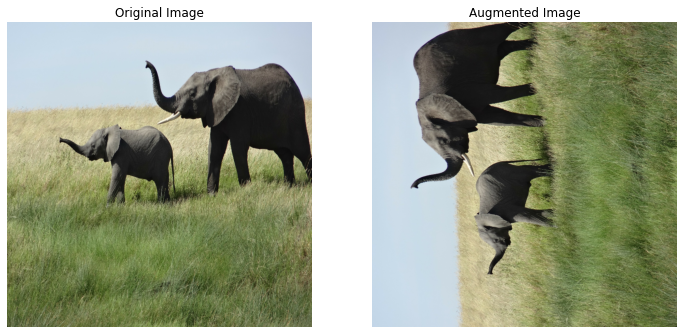

In [8]:
# Get an image
img = images[0]
img_copy = img.copy()

# Pass the image copy to augmentation pipeline
augmented = jnp.rot90(img_copy, axes=(0, 1))

# Plot the original image and the augmented image
_, ax = plt.subplots(1, 2, figsize=(12, 8))

ax[0].imshow(img)
ax[0].axis("off")
ax[0].set_title("Original Image")

ax[1].imshow(augmented)
ax[1].axis("off")
ax[1].set_title("Augmented Image")

plt.show()

In [9]:
# Utility function for plotting the images
def plot_images(images, batch_size, num_cols=4, figsize=(15, 8), title="Images "):
    num_rows = batch_size // num_cols
    
    _, ax = plt.subplots(num_rows, num_cols, figsize=figsize)
    
    for i, img in enumerate(images):
        ax[i // num_cols, i % num_cols].imshow(images[i])
        ax[i // num_cols, i % num_cols].axis("off")
        #ax[i // num_cols, i % num_cols].set_title(str(i+1))
        
    plt.tight_layout()
    plt.suptitle(title, x=0.5, y=1.0, fontsize=16)
    plt.show()

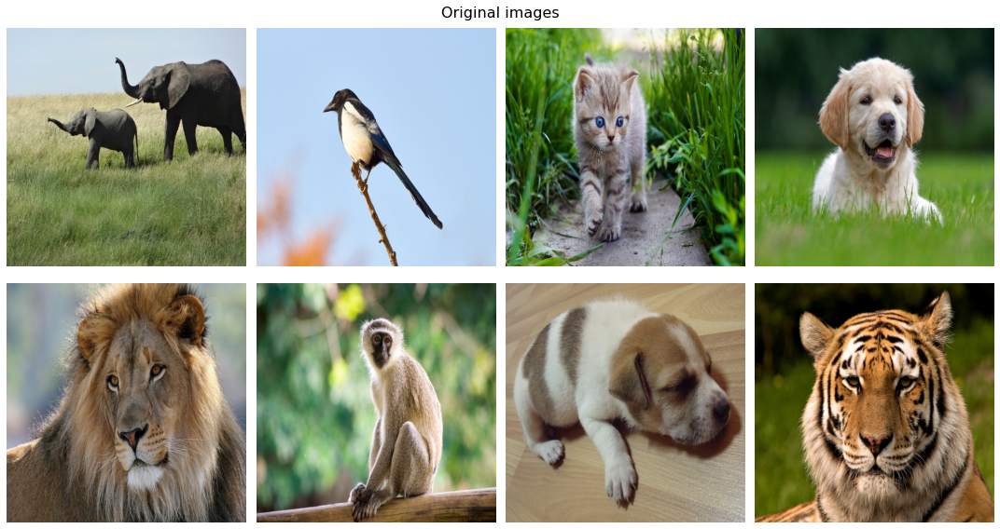

In [10]:
plot_images(images, batch_size=8, title="Original images")

In [12]:
from jax import vmap, jit
augmented = jit(vmap(jnp.rot90, in_axes=(0)))(images)

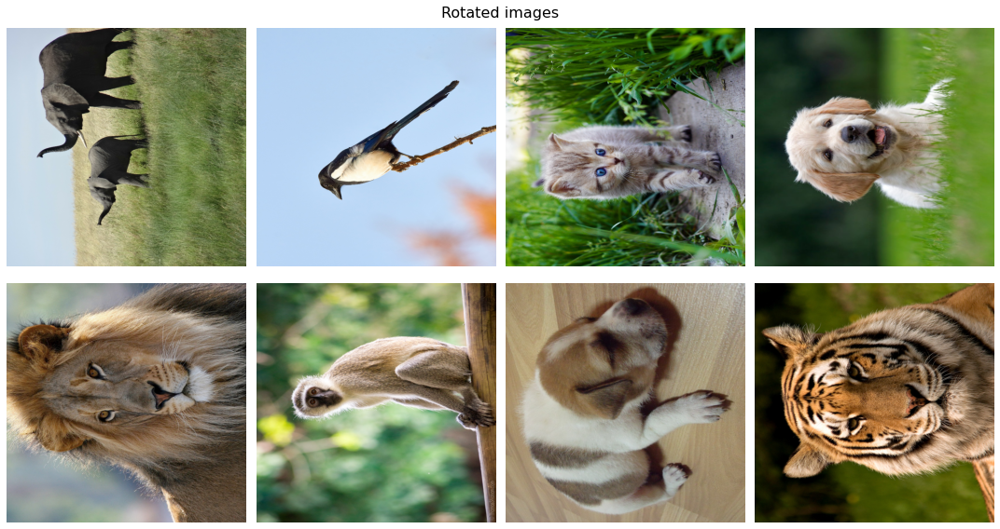

In [13]:
plot_images(augmented, batch_size=8, title="Rotated images")

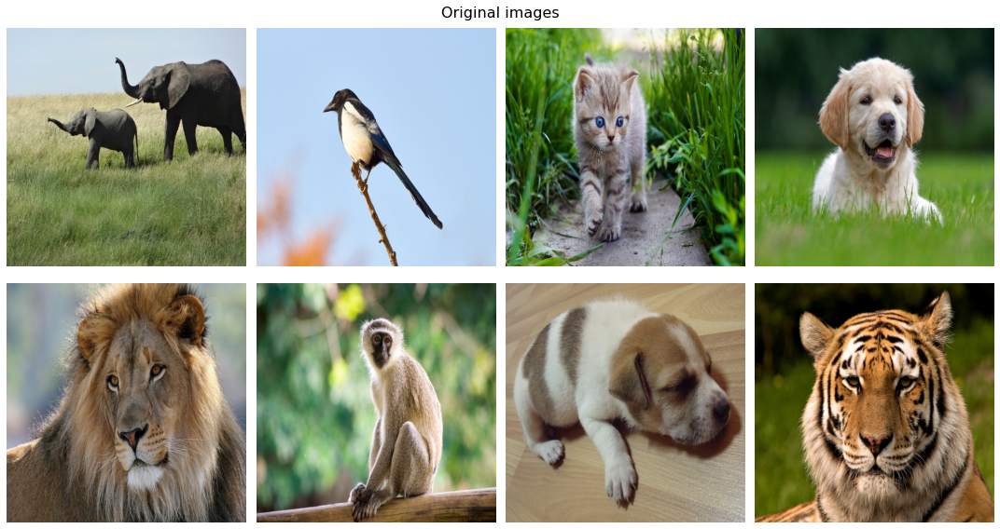

In [14]:
plot_images(images, batch_size=8, title="Original images")

In [15]:
from jax import random
def rotate_90(img):
    """Rotates an image by 90 degress k times."""
    return jnp.rot90(img, k=1, axes=(0, 1))


def identity(img):
    """Returns an image as it is."""
    return img


def flip_left_right(img):
    """Flips an image left/right direction."""
    return jnp.fliplr(img)


def flip_up_down(img):
    """Flips an image in up/down direction."""
    return jnp.flipud(img)


def random_rotate(img, rotate):
    """Randomly rotate an image by 90 degrees.
    
    Args:
        img: Array representing the image
        rotate: Boolean for rotating or not
    Returns:
        Rotated or an identity image
    """

    return jax.lax.cond(rotate, rotate_90, identity, img)


def random_horizontal_flip(img, flip):
    """Randomly flip an image vertically.
    
    Args:
        img: Array representing the image
        flip: Boolean for flipping or not
    Returns:
        Flipped or an identity image
    """
    
    return jax.lax.cond(flip, flip_left_right, identity, img)
    
    
def random_vertical_flip(img, flip):
    """Randomly flip an image vertically.
    
    Args:
        img: Array representing the image
        flip: Boolean for flipping or not
    Returns:
        Flipped or an identity image
    """
    
    return jax.lax.cond(flip, flip_up_down, identity, img)


# Get the jitted version of our augmentation functions
random_rotate_jitted = jit(vmap(random_rotate, in_axes=(0, 0)))
random_horizontal_flip_jitted = jit(vmap(random_horizontal_flip, in_axes=(0, 0)))
random_vertical_flip_jitted = jit(vmap(random_vertical_flip, in_axes=(0, 0)))


def augment_images(images, key):
    """Augment a batch of input images.
    
    Args:
        images: Batch of input images as a jax array
        key: Seed/Key for random functions for generating booleans
    Returns:
        Augmented images with the same shape as the input images
    """
    
    batch_size = len(images)
    
    # 1. Rotation
    key, subkey = random.split(key)
    rotate = random.randint(key, shape=[batch_size], minval=0, maxval=2)
    augmented = random_rotate_jitted(images, rotate)
    
    # 2. Flip horizontally
    key, subkey = random.split(key)
    flip = random.randint(key, shape=[batch_size], minval=0, maxval=2)
    augmented = random_horizontal_flip_jitted(augmented, flip)
    
    # 3. Flip vertically
    key, subkey = random.split(key)
    flip = random.randint(key, shape=[batch_size], minval=0, maxval=2)
    augmented = random_vertical_flip_jitted(augmented, flip)
    
    return augmented.block_until_ready()

In [16]:
key=random.PRNGKey(0)
augmented = augment_images(images, key)

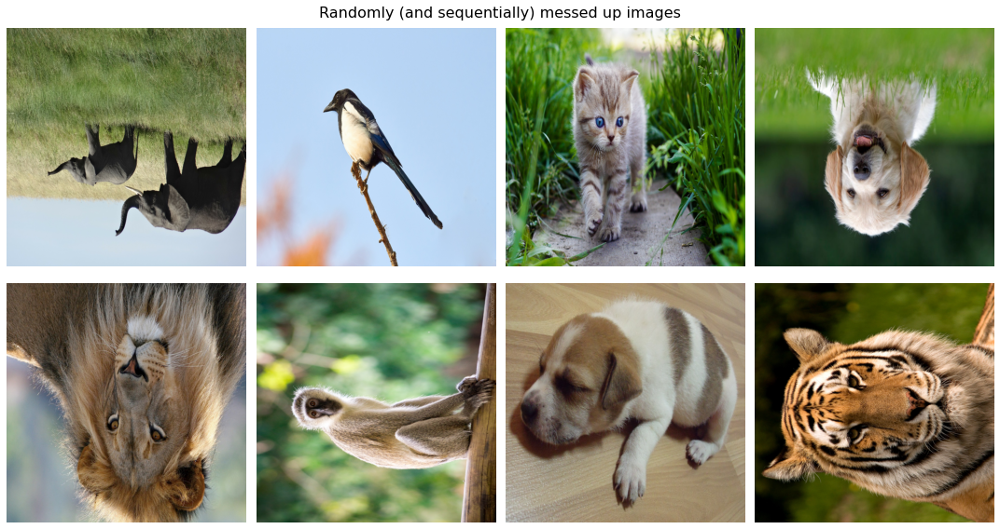

In [17]:
plot_images(augmented, batch_size=8, title="Randomly (and sequentially) messed up images")

In [18]:
# Generate a big batch of 8*num_replicas
big_batch_images = jnp.stack([images for i in range(num_replicas)])
print("Number of images in batch: ", big_batch_images.shape[0])

# Generate a batch of keys as well as the augment_images
# function accepts a key as well
key = random.PRNGKey(123)
print(key)
big_batch_keys = [key]

for i in range(num_replicas - 1):
    key, subkey = random.split(key)
    big_batch_keys.append(key)
print(big_batch_keys)    
big_batch_keys = jnp.stack(big_batch_keys)
big_batch_keys

Number of images in batch:  2
[  0 123]
[DeviceArray([  0, 123], dtype=uint32), DeviceArray([1896456402,   17229315], dtype=uint32)]


DeviceArray([[         0,        123],
             [1896456402,   17229315]], dtype=uint32)

In [19]:
# Get the jitted version of our augmentation functions
random_rotate_vmapped = vmap(random_rotate, in_axes=(0, 0))
random_horizontal_flip_vmapped = vmap(random_horizontal_flip, in_axes=(0, 0))
random_vertical_flip_vmapped = vmap(random_vertical_flip, in_axes=(0, 0))


def augment_images_nojit(images, key):
    """Augment a batch of input images.
    
    Args:
        images: Batch of input images as a jax array
        key: Seed/Key for random functions for generating booleans
    Returns:
        Augmented images with the same shape as the input images
    """
    
    batch_size = len(images)
    
    # 1. Rotation
    key, subkey = random.split(key)
    rotate = random.randint(key, shape=[batch_size], minval=0, maxval=2)
    augmented = random_rotate_vmapped(images, rotate)
    
    # 2. Flip horizontally
    key, subkey = random.split(key)
    flip = random.randint(key, shape=[batch_size], minval=0, maxval=2)
    augmented = random_horizontal_flip_vmapped(augmented, flip)
    
    # 3. Flip vertically
    key, subkey = random.split(key)
    flip = random.randint(key, shape=[batch_size], minval=0, maxval=2)
    augmented = random_vertical_flip_vmapped(augmented, flip)
    
    return augmented

In [22]:
from jax import pmap
pmapped_augment_images = pmap(augment_images_nojit, in_axes=(0, 0))
augmented_parallel = pmapped_augment_images(big_batch_images, big_batch_keys)

In [23]:
augmented_parallel

ShardedDeviceArray([[[[[195, 213, 233],
                       [196, 214, 234],
                       [195, 213, 233],
                       ...,
                       [ 45,  54,  25],
                       [ 44,  53,  24],
                       [ 49,  59,  29]],

                      [[195, 213, 233],
                       [197, 215, 235],
                       [196, 214, 234],
                       ...,
                       [ 64,  74,  40],
                       [ 40,  49,  18],
                       [ 53,  63,  33]],

                      [[196, 214, 234],
                       [195, 213, 232],
                       [195, 214, 232],
                       ...,
                       [106, 116,  78],
                       [ 71,  81,  47],
                       [ 52,  61,  28]],

                      ...,

                      [[188, 201, 220],
                       [188, 201, 220],
                       [188, 201, 220],
                       ...,
              

In [24]:
augmented_parallel.shape

(2, 8, 800, 800, 3)

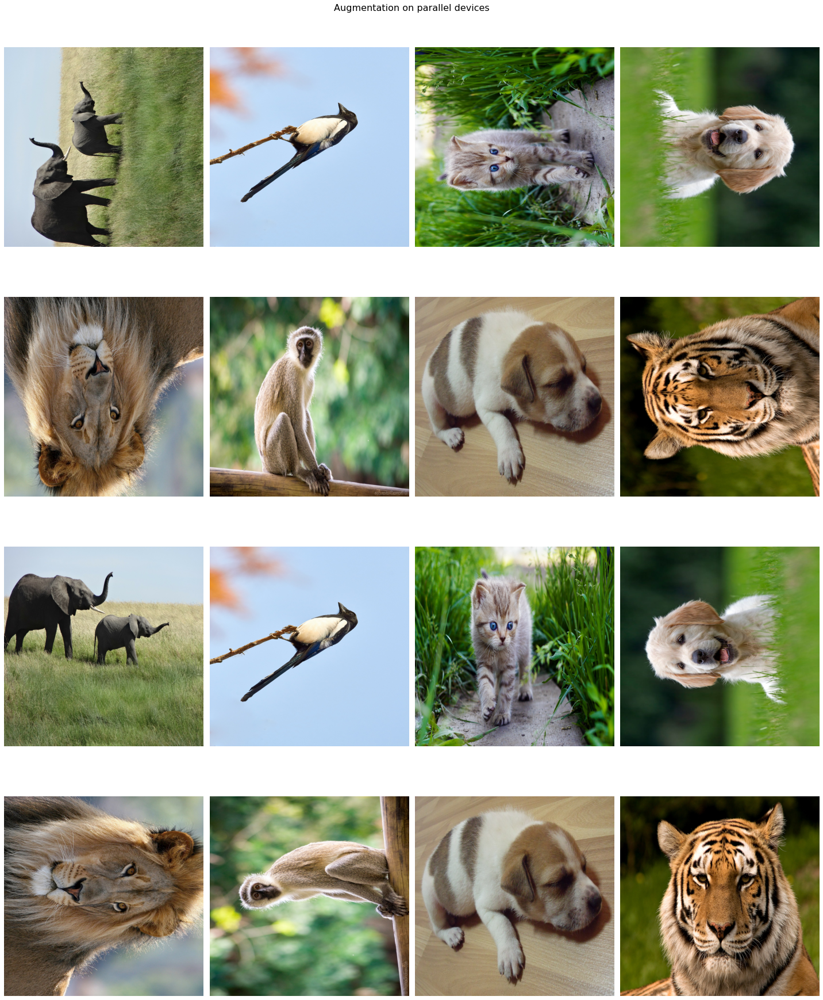

In [25]:
augmented_parallel_reduced = augmented_parallel.reshape(8*num_replicas, 800, 800, 3)
plot_images(augmented_parallel_reduced,
            batch_size=8*num_replicas,
            title="Augmentation on parallel devices",
            figsize=(20, 25)
           )